## PROBLEM STATEMENT (<250 words)

In this paper, we aim to use visual analytical approaches to analyse patterns and trends in crime data of San Francisco. As crime events are increasing over time, resulting in massive crime datasets. It is worthwhile to analyse crime patterns in order to get useful insights from the data. Our work is mainly concerned in:
- Time
    - How does crime vary over time?
        • Over the year
        • Over the week
        • Over a day
- Space
    - In which districts are there most crimes? Are there any crime hotspots?
- Spatio-temporal
    - Do crime hotspots vary over time?
- Types of crime
    - Are there any striking differences between different types of crimes in terms of:
        – Where and where they occur?
- Temporal correlation
    - How highly correlated are different types of crime temporally?
- Prediction
    - How well can crime rates be predicted?


This data was collected between the years 1/1/2003 to 5/13/2015. It has a 878,049 number of observations and 9 attributes describing the recorded crimes. The attributes in data gives us information about districts where the crime occurred, the actual type of crime and the time and day of the crime. We have spatial coordinates longitude and latitude which allows us to plot exact location of the crime on the map of San Francisco.


The data has 2,323 duplicated records which have been removed. After removing duplicated rows, the dataset is left with 875,726 number of rows. There are three nominal categorical variables which are called “Category”, “District”, and “Day of week”. New features  extracted from timestamp variable are month, year ,date, hour and minute.



# Data Visualization with Plotly: Street Robberies in San Francisco

In [40]:
import plotly
import chart_studio.plotly as py
import chart_studio
chart_studio.tools.set_credentials_file(username='adammahmood', api_key='1ELCJp6I7UFB1TqMq4a9')

import plotly.graph_objs as go
from plotly.tools import make_subplots
import plotly.express as px

# Data exploration
import pandas as pd

# Numerical
import numpy as np
import math

# Spatial analysis
import geopandas as gpd   # used to read .shp file
import matplotlib.pyplot as plt
import folium as fm
import seaborn as sns
from shapely.geometry import Point, Polygon, shape
from IPython.core.display import Markdown, display, HTML

In [41]:
# beautify the screen display
%matplotlib inline
pd.options.display.max_columns = 200
#display(HTML("<style>.container { width:100% !important; }</style>"))
display(HTML("""<style>
  .rendered_html tr, .rendered_html th,  .rendered_html td {   text-align: right; }  
  .rendered_html :first-child {   text-align: left; } 
  .rendered_html :last-child {   text-align: left; }
  </style>"""))

# Tweak default output of pyplots
screen_dpi = plt.rcParams['figure.dpi']
# 'figsize' is in inches, so convert desired default figure size in pixels into inches using the given sceen dpi 
plt.rcParams["figure.figsize"] = [800/screen_dpi,600/screen_dpi]

In [42]:
#file_2003_2018 = "Police_Department_Incident_Reports__Historical_2003_to_May_2018.csv"
file_2003_2018 = "crimedata.csv"
#read file without Location column
PD_Recs_2003_2018 = pd.read_csv(file_2003_2018)


In [194]:
lat_range = [PD_Recs_2003_2018['Y'].min(),PD_Recs_2003_2018['Y'].max()]
long_range = [PD_Recs_2003_2018['X'].min(),PD_Recs_2003_2018['X'].max()]

Checl memory usage

In [43]:
for dtype in ['float64','int64','object']:
    selected_dtype = PD_Recs_2003_2018.select_dtypes(include=[dtype])
    mean_usage_b = selected_dtype.memory_usage(deep=True).mean()
    mean_usage_mb = mean_usage_b / 1024 ** 2
    print("Average memory usage for {} columns: {:03.2f} MB".format(dtype,mean_usage_mb))

Average memory usage for float64 columns: 11.26 MB
Average memory usage for int64 columns: 12.66 MB
Average memory usage for object columns: 137.25 MB


In [44]:
PD_Recs_2003_2018=PD_Recs_2003_2018.drop(
    ['Location', 'PdId'],1)

In [45]:
PD_Recs_2003_2018.head(10)

,IncidntNum,Category,Descript,DayOfWeek,Date,Time,PdDistrict,Resolution,Address,X,Y,Month,Year
0,50753390,FRAUD,FRAUDULENT CREDIT APPLICATION,Wednesday,2003-01-01,00:01,BAYVIEW,NONE,0 Block of OSCEOLA LN,-122.383085,37.731752,January,2003
1,51362409,FORGERY/COUNTERFEITING,"CHECKS, MAKE OR PASS FICTITIOUS",Wednesday,2003-01-01,00:01,INGLESIDE,NOT PROSECUTED,5500 Block of MISSION ST,-122.445418,37.712075,January,2003
2,30322341,SUSPICIOUS OCC,SUSPICIOUS OCCURRENCE,Wednesday,2003-01-01,00:01,TARAVAL,UNFOUNDED,1700 Block of 21ST AV,-122.478748,37.755059,January,2003
3,41416367,OTHER OFFENSES,OBSCENE PHONE CALLS(S),Wednesday,2003-01-01,00:01,BAYVIEW,NONE,500 Block of HOLYOKE ST,-122.407721,37.724547,January,2003
4,40232138,FRAUD,"FALSE PRETENSES, GRAND THEFT",Wednesday,2003-01-01,00:01,SOUTHERN,NONE,800 Block of BRYANT ST,-122.403405,37.775421,January,2003
5,30018409,NON-CRIMINAL,LOST PROPERTY,Wednesday,2003-01-01,00:01,RICHMOND,NONE,GEARY BL / 17TH AV,-122.476169,37.780475,January,2003
6,50569200,ASSAULT,THREATS AGAINST LIFE,Wednesday,2003-01-01,00:01,INGLESIDE,NONE,0 Block of 27TH ST,-122.421899,37.747146,January,2003
7,21623770,ASSAULT,CHILD ABUSE (PHYSICAL),Wednesday,2003-01-01,00:01,MISSION,UNFOUNDED,2600 Block of BRYANT ST,-122.408983,37.751987,January,2003
8,30063216,FORGERY/COUNTERFEITING,"CHECKS, FORGERY (FELONY)",Wednesday,2003-01-01,00:01,BAYVIEW,NONE,100 Block of DAKOTA ST,-122.395635,37.753565,January,2003
9,30064606,NON-CRIMINAL,LOST PROPERTY,Wednesday,2003-01-01,00:01,CENTRAL,NONE,800 Block of VALLEJO ST,-122.411281,37.798213,January,2003


In [46]:
PD_Recs_2003_2018['Date_Time'] = PD_Recs_2003_2018['Date'] + ' ' + PD_Recs_2003_2018['Time']

PD_Recs_2003_2018['Date_Time'] = pd.to_datetime(PD_Recs_2003_2018['Date_Time'],format="%Y/%m/%d %H:%M")
#specifying format vastly improves the speed!
PD_Recs_2003_2018.sort_values(['Date','Time'])
PD_Recs_2003_2018 = PD_Recs_2003_2018.drop(['Date', 'Time'],axis=1)

In [47]:
def date_time(data):
    data['Year'] = data['Date_Time'].dt.year
    data['Month'] = data['Date_Time'].dt.month_name()
    data['Day'] = data['Date_Time'].dt.day
    data['Hour'] = data['Date_Time'].dt.hour
    data['Day Of Week'] = data['Date_Time'].dt.dayofweek
    return data


In [48]:
date_time(PD_Recs_2003_2018).info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2213165 entries, 0 to 2213164
Data columns (total 15 columns):
IncidntNum     int64
Category       object
Descript       object
DayOfWeek      object
PdDistrict     object
Resolution     object
Address        object
X              float64
Y              float64
Month          object
Year           int64
Date_Time      datetime64[ns]
Day            int64
Hour           int64
Day Of Week    int64
dtypes: datetime64[ns](1), float64(2), int64(5), object(7)
memory usage: 253.3+ MB


In [49]:
#PD_Recs_2003_2017 = PD_Recs_2003_2018[PD_Recs_2003_2018['Year']<2018]

# Prepare Geographic Data 

In [50]:
nhood_map = gpd.read_file('Neighborhoods/geo_export_440989e3-5908-49cd-81c2-c3d23839267a.shp')

# Convert PD_Recs_2003_2017 to a GeoDataFrame
PD_Recs_2003_2018['Coords'] = PD_Recs_2003_2018[['X','Y']].apply(tuple,axis=1).apply(Point)
PD_Recs_2003_2018 = gpd.GeoDataFrame(PD_Recs_2003_2018,geometry='Coords')

In [51]:
# Locate the neighborhoods of each incident by merging the two dataframes. 
PD_Recs_2003_2018.crs = nhood_map.crs
PD_Recs_nhood_map = gpd.sjoin(nhood_map,PD_Recs_2003_2018)

In [52]:
PD_Recs_nhood_map.head()

,nhood,geometry,index_right,IncidntNum,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y,Month,Year,Date_Time,Day,Hour,Day Of Week
0,Bayview Hunters Point,"POLYGON ((-122.38158 37.75307, -122.38157 37.7...",524919,60856768,WEAPON LAWS,DISCHARGE FIREARM WITHIN CITY LIMITS,Sunday,BAYVIEW,NONE,EVANS AV / JENNINGS ST,-122.379111,37.737683,August,2006,2006-08-13 02:52:00,13,2,6
0,Bayview Hunters Point,"POLYGON ((-122.38158 37.75307, -122.38157 37.7...",988512,91262483,VEHICLE THEFT,STOLEN AUTOMOBILE,Thursday,BAYVIEW,NONE,200 Block of JENNINGS ST,-122.378366,37.738411,December,2009,2009-12-10 14:30:00,10,14,3
0,Bayview Hunters Point,"POLYGON ((-122.38158 37.75307, -122.38157 37.7...",429801,51366592,VEHICLE THEFT,RECOVERED VEHICLE - STOLEN OUTSIDE SF,Monday,BAYVIEW,NONE,200 Block of JENNINGS ST,-122.378366,37.738411,December,2005,2005-12-05 00:52:00,5,0,0
0,Bayview Hunters Point,"POLYGON ((-122.38158 37.75307, -122.38157 37.7...",184557,40346159,LARCENY/THEFT,PETTY THEFT FROM LOCKED AUTO,Thursday,BAYVIEW,NONE,200 Block of JENNINGS ST,-122.378366,37.738411,March,2004,2004-03-25 10:00:00,25,10,3
0,Bayview Hunters Point,"POLYGON ((-122.38158 37.75307, -122.38157 37.7...",206112,40556336,BURGLARY,"BURGLARY,BLDG. UNDER CONSTRUCTION, FORCIBLE ENTRY",Saturday,BAYVIEW,DISTRICT ATTORNEY REFUSES TO PROSECUTE,200 Block of JENNINGS ST,-122.378479,37.738475,May,2004,2004-05-15 09:21:00,15,9,5


In [53]:
import os
if not os.path.exists("python_images"):
    os.mkdir("python_images")

# Neighborhood & Police District wise mapping of all crimes

In [54]:
nhood_incidents_all = PD_Recs_nhood_map.nhood.value_counts()
nhood_map = nhood_map.merge(nhood_incidents_all.to_frame('Incidents_All'), left_on = 'nhood',right_index = True)
abbreviations = ['Bayview', 'Brnl', 'Castro', 'ChTwn', 'Exclsr', 'FinDist', 'GlenPark', 'InRich', 'ggPark', 'Haight', 'Hayes', 'In_Sun', 'JpTwn', 'McLrn', 'TndrLn', 'LakeSh', 'Lncln', 'USF', 'Marina', 'Rus_Hill', 'Mission', 'MisBay', 'Nob','SeaClf', 'Noe', 'N_Beach', 'Inglsde', 'SoMA', 'Sunset/Parkside', 'Out_Mis', 'Out_Rich', 'Pcfc_Hts', 'Prtl', 'Potrero Hill', 'Presidio', 'Prsd_Hts' , 'T_Isl', 'TwinPks', 'V_Val','WoTP', 'W_Add']    
nhood_map['abbr'] = abbreviations


In [55]:
nhood_map

,nhood,geometry,Incidents_All,abbr
0,Bayview Hunters Point,"POLYGON ((-122.38158 37.75307, -122.38157 37.7...",148582,Bayview
1,Bernal Heights,"POLYGON ((-122.40361 37.74934, -122.40378 37.7...",46605,Brnl
2,Castro/Upper Market,"POLYGON ((-122.42656 37.76948, -122.42695 37.7...",61816,Castro
3,Chinatown,"POLYGON ((-122.40623 37.79756, -122.40551 37.7...",34964,ChTwn
4,Excelsior,"POLYGON ((-122.42398 37.73155, -122.42392 37.7...",43106,Exclsr
5,Financial District/South Beach,"MULTIPOLYGON (((-122.38753 37.78280, -122.3875...",147300,FinDist
6,Glen Park,"POLYGON ((-122.44738 37.74648, -122.44728 37.7...",10824,GlenPark
7,Inner Richmond,"POLYGON ((-122.45932 37.78752, -122.45928 37.7...",27175,InRich
8,Golden Gate Park,"POLYGON ((-122.44092 37.77363, -122.44073 37.7...",22472,ggPark
9,Haight Ashbury,"POLYGON ((-122.43200 37.77143, -122.43190 37.7...",42535,Haight


In [56]:
#police district shapefile
police_districts =  gpd.read_file('Current Police Districts/geo_export_47e899db-fd66-4dbc-989e-07ef29421673.shp')
pd_geom = police_districts.set_index('district')

pd_incidents = PD_Recs_nhood_map.PdDistrict.value_counts()
pd_geom = pd_geom.merge(pd_incidents.to_frame('Incidents'), left_index=True, right_index=True)

In [57]:
pd_geom

,company,shape_area,shape_le_1,shape_leng,geometry,Incidents
SOUTHERN,B,9.134414e+07,100231.353916,87550.275142,"MULTIPOLYGON (((-122.39186 37.79425, -122.3917...",399741
BAYVIEW,C,2.013846e+08,144143.480351,163013.798332,"POLYGON ((-122.38098 37.76480, -122.38103 37.7...",220868
MISSION,D,8.062384e+07,40518.834235,40152.783389,"POLYGON ((-122.40954 37.76932, -122.40862 37.7...",300074
NORTHERN,E,8.278169e+07,50608.310321,56493.858208,"POLYGON ((-122.43379 37.80793, -122.43375 37.8...",272683
TENDERLOIN,J,1.107215e+07,18796.784185,12424.268969,"POLYGON ((-122.40217 37.78626, -122.41718 37.7...",191712
CENTRAL,A,5.595027e+07,67686.522865,64025.129073,"POLYGON ((-122.42612 37.80684, -122.42612 37.8...",226247
PARK,F,8.487896e+07,50328.913294,46307.776968,"POLYGON ((-122.43956 37.78314, -122.43832 37.7...",125475
RICHMOND,G,1.379640e+08,75188.628361,69991.465355,"POLYGON ((-122.44127 37.79149, -122.44060 37.7...",115087
INGLESIDE,H,1.935805e+08,74474.181164,74737.936295,"POLYGON ((-122.40450 37.74858, -122.40407 37.7...",193666
TARAVAL,I,2.846767e+08,73470.424000,75350.217521,"POLYGON ((-122.49842 37.70810, -122.49842 37.7...",166717


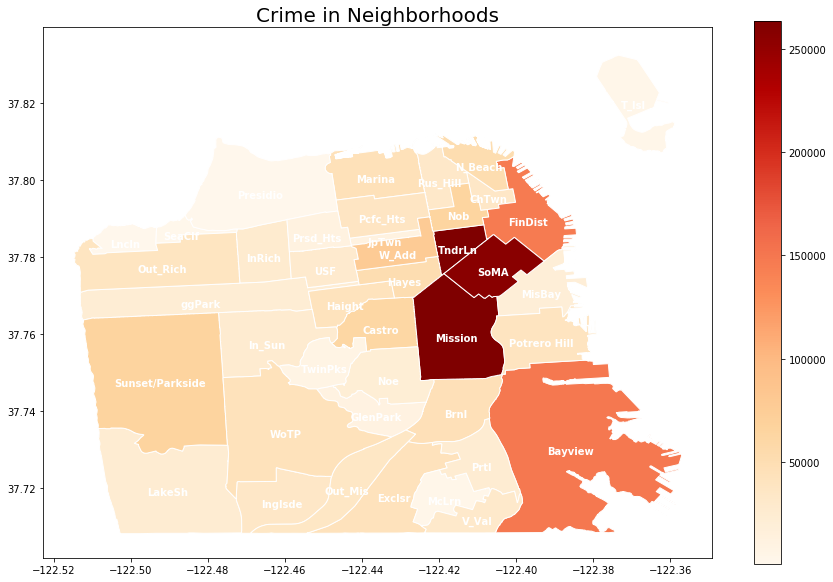

In [58]:
#fig, (ax1, ax2) = plt.subplots(1, 2)
ax1 = nhood_map.plot(column = 'Incidents_All',figsize=(15,10),legend =True,linewidth=1,edgecolor='white', cmap='OrRd')
ax1.axis('on')
ax1.set_title('Crime in Neighborhoods',fontsize=20,color='black')

for i in nhood_map.index:
    coords = nhood_map.geometry[i].centroid.coords[0]
    ax1.annotate(s = nhood_map['abbr'][i], xy = coords,horizontalalignment='center',verticalalignment='top' ,color='white',fontweight='heavy')
ax1
plt.savefig('python_images/Crimes_Nhood.png',transparent=True)

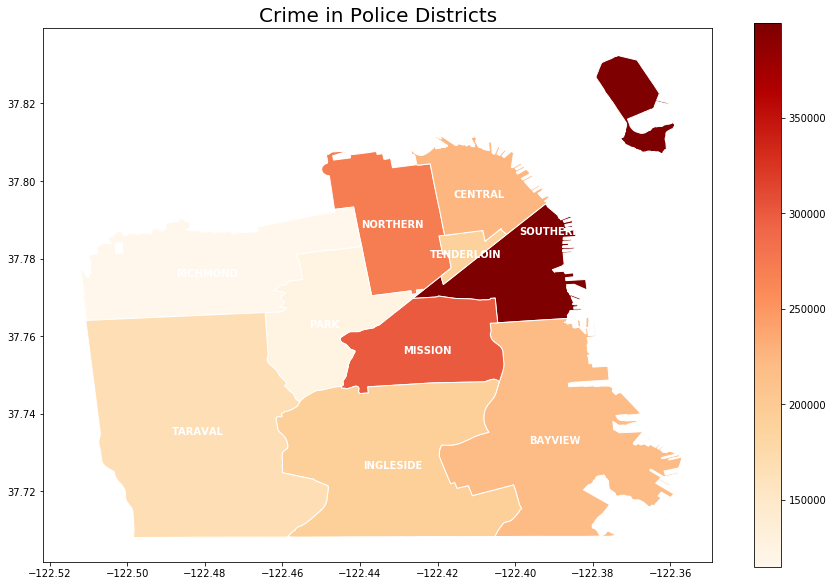

In [59]:
ax2 = pd_geom.plot(column = 'Incidents',figsize=(15,10),legend =True,linewidth=1,edgecolor='white', cmap='OrRd')
ax2.axis('on')
ax2.set_title('Crime in Police Districts',fontsize=20,color='black')
for i in pd_geom.index:
    coords = pd_geom.geometry[i].centroid.coords[0]
    ax2.annotate(s = i, xy = coords,horizontalalignment='center',verticalalignment='top' ,color='white',fontweight='heavy')

ax2
plt.savefig('python_images/Crime_PdD.png',transparent=True)

# Monthly Crime Variation Per Category

In [20]:
def create_line_plot(crimes_df,image_name,height=1000, width=1000,vert_spacing=0.031,hori_spacing=0.028,no_of_cols = 5,shared_x_axes=False):
    no_of_categories = len(crimes_df.columns)
    no_of_rows = math.ceil(no_of_categories/no_of_cols)
    fig = make_subplots(rows=no_of_rows, cols=no_of_cols,subplot_titles=crimes_df.columns,vertical_spacing=vert_spacing,
                    horizontal_spacing=hori_spacing,shared_xaxes=shared_x_axes)
    i = 1
    j = 1
    counter = 1
    for col in crimes_df.columns:
        x = crimes_df.index
        y = crimes_df[col]
        freq_monthly = go.Scatter(x = x,y = y, line= dict(width=1,shape='spline',smoothing=1.3),
            mode = 'lines+markers', marker= dict(size= 1,symbol='square',colorscale='Viridis',
            opacity= 0.3),name = col)
        fig.add_trace(freq_monthly,row=i,col=j)
        if(counter % no_of_cols == 0):
            i +=1
            j=1
        else:
            j +=1

        counter +=1
    for i in fig['layout']['annotations']:
        i['font'] = dict(size=8,color='#ff0000')
    fig.update_layout(height=height, width=width, title_text="Subplots")
    fig.write_image("python_images/{}.png".format(image_name))
    fig.show()

In [21]:
crimes_per_month = PD_Recs_nhood_map.set_index('Date_Time').groupby([pd.Grouper(freq='m'),'Category'])['Month'].count().unstack().fillna(0)
create_line_plot(crimes_per_month,'crimes_per_month',height=1200, width=1100,vert_spacing=0.05,hori_spacing=0.029)

#plt.savefig('crimes_per_month.png',transparent=True)

C:\ProgramData\Anaconda3\lib\site-packages\plotly\tools.py:465: DeprecationWarning:

plotly.tools.make_subplots is deprecated, please use plotly.subplots.make_subplots instead



In [22]:
categories = PD_Recs_nhood_map['Category'].unique()
data = []
no_of_categories = len(categories)
no_of_cols = 4
no_of_rows = math.ceil(no_of_categories/no_of_cols)
fig = make_subplots(rows=no_of_rows, cols=no_of_cols)
i = 1
j = 1
counter = 1
for category in categories:
    crime = PD_Recs_nhood_map[(PD_Recs_nhood_map['Category']==category)]
    #Monthly Frequency of Street Robberies 
    per_month = crime.set_index('Date_Time').groupby(pd.Grouper(freq='m'))['Month'].count()
    x = per_month.index
    y = per_month

    freq_monthly = go.Scatter(x = x,y = y, line= dict(width=1,shape='spline',smoothing=1.3),
        mode = 'lines+markers', marker= dict(size= 1,symbol='square',colorscale='Viridis',
        opacity= 0.3),name = category )
    fig.add_trace(freq_monthly,row=i,col=j)
    if(counter % no_of_cols == 0):
        i +=1
        j= 1
    else: 
        j +=1
    counter +=1    
    data += [freq_monthly]

layout = go.Layout(
    title = 'Monthly Frequencies of Crime',
    plot_bgcolor = 'rgb(248, 248, 248)',
    paper_bgcolor='rgb(254, 254, 254)',
    #legend=dict(orientation='h'),
    dragmode = 'zoom',
    width=1000,
)

#fig = go.Figure(data=data, layout = layout)

#py.iplot(fig)
fig.update_layout(height=800, width=950, title_text="Subplots")
fig.write_image("python_images/{}.png".format('crimes_per_month2'))
fig.show()

# Yearly Crime Variation Per Category

In [23]:
#fig,ax = plt.subplots(figsize=(15,7))
crimes_per_year = PD_Recs_nhood_map.set_index('Date_Time').groupby([pd.Grouper(freq='y'),'Category'])['Year'].count().unstack().fillna(0)
crimes_per_year

Category,ARSON,ASSAULT,BAD CHECKS,BRIBERY,BURGLARY,DISORDERLY CONDUCT,DRIVING UNDER THE INFLUENCE,DRUG/NARCOTIC,DRUNKENNESS,EMBEZZLEMENT,EXTORTION,FAMILY OFFENSES,FORGERY/COUNTERFEITING,FRAUD,GAMBLING,KIDNAPPING,LARCENY/THEFT,LIQUOR LAWS,LOITERING,MISSING PERSON,NON-CRIMINAL,OTHER OFFENSES,PORNOGRAPHY/OBSCENE MAT,PROSTITUTION,RECOVERED VEHICLE,ROBBERY,RUNAWAY,SECONDARY CODES,"SEX OFFENSES, FORCIBLE","SEX OFFENSES, NON FORCIBLE",STOLEN PROPERTY,SUICIDE,SUSPICIOUS OCC,TREA,TRESPASS,VANDALISM,VEHICLE THEFT,WARRANTS,WEAPON LAWS
Date_Time,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2003-12-31,293.0,13447.0,134.0,28.0,6046.0,886.0,289.0,9911.0,662.0,240.0,43.0,116.0,2320.0,3280.0,27.0,317.0,26368.0,281.0,175.0,3698.0,13129.0,21216.0,3.0,1950.0,0.0,3198.0,366.0,1272.0,697.0,28.0,799.0,93.0,4194.0,0.0,1434.0,6445.0,15318.0,9069.0,1281.0
2004-12-31,279.0,12891.0,79.0,39.0,6750.0,812.0,244.0,9891.0,600.0,201.0,57.0,109.0,2292.0,2743.0,25.0,277.0,24487.0,350.0,236.0,3673.0,13765.0,20683.0,3.0,1527.0,0.0,3372.0,431.0,1343.0,697.0,31.0,640.0,100.0,4483.0,0.0,1190.0,6493.0,17861.0,8109.0,1251.0
2005-12-31,231.0,11591.0,101.0,38.0,7067.0,687.0,196.0,8529.0,635.0,197.0,34.0,64.0,2209.0,2490.0,29.0,276.0,25298.0,278.0,273.0,3703.0,14033.0,17800.0,5.0,1103.0,0.0,3565.0,388.0,1001.0,638.0,24.0,537.0,79.0,4691.0,0.0,1033.0,7012.0,18168.0,6695.0,1339.0
2006-12-31,240.0,12441.0,87.0,36.0,7002.0,521.0,264.0,9067.0,703.0,229.0,49.0,89.0,2303.0,2597.0,28.0,318.0,27336.0,248.0,96.0,4253.0,13363.0,18297.0,6.0,1290.0,1086.0,4128.0,382.0,1375.0,598.0,29.0,574.0,86.0,4773.0,0.0,1102.0,7685.0,7285.0,6497.0,1323.0
2007-12-31,246.0,12514.0,69.0,56.0,5453.0,581.0,313.0,10560.0,671.0,269.0,41.0,79.0,2591.0,2348.0,37.0,345.0,25736.0,401.0,430.0,4023.0,12674.0,19758.0,4.0,1873.0,987.0,4019.0,272.0,1475.0,631.0,39.0,527.0,111.0,4798.0,0.0,1198.0,7558.0,6456.0,7102.0,1318.0
2008-12-31,248.0,12671.0,78.0,49.0,5677.0,789.0,408.0,11648.0,710.0,242.0,52.0,72.0,2468.0,2559.0,27.0,344.0,25759.0,499.0,441.0,4335.0,12297.0,23437.0,5.0,1673.0,832.0,4225.0,259.0,1575.0,682.0,20.0,516.0,100.0,4749.0,0.0,1150.0,7336.0,6049.0,5798.0,1419.0
2009-12-31,222.0,12271.0,64.0,46.0,5379.0,956.0,579.0,11946.0,804.0,214.0,92.0,83.0,2209.0,2509.0,28.0,478.0,25541.0,394.0,126.0,3657.0,12393.0,24672.0,0.0,1468.0,654.0,3574.0,340.0,1782.0,682.0,17.0,660.0,83.0,4624.0,0.0,1232.0,7598.0,5182.0,5760.0,1431.0
2010-12-31,209.0,12383.0,54.0,61.0,4965.0,827.0,458.0,9204.0,706.0,155.0,58.0,95.0,1089.0,2652.0,10.0,355.0,24399.0,324.0,187.0,4512.0,13868.0,20976.0,4.0,1299.0,608.0,3317.0,293.0,1868.0,733.0,30.0,680.0,82.0,6000.0,2.0,1149.0,7928.0,4341.0,6182.0,1348.0
2011-12-31,203.0,12272.0,45.0,47.0,4987.0,762.0,470.0,6931.0,652.0,168.0,41.0,58.0,820.0,2752.0,17.0,421.0,25831.0,261.0,124.0,4756.0,15575.0,19543.0,3.0,1094.0,693.0,3369.0,320.0,1812.0,734.0,29.0,779.0,76.0,6202.0,0.0,1072.0,7235.0,4760.0,6305.0,1328.0


In [24]:
#crimes_per_year.plot()
#plt.show()
create_line_plot(crimes_per_year,'crimes_per_year',height=1200, width=1100,vert_spacing=0.05,hori_spacing=0.029)


# Day of the week Crime Variation Per Category

In [25]:
#fig,ax = plt.subplots(figsize=(15,7))
crimes_per_each_day_of_week = PD_Recs_nhood_map.set_index('Date_Time').groupby(['DayOfWeek','Category'])['Category'].count().unstack().fillna(0)
crimes_per_each_day_of_week

Category,ARSON,ASSAULT,BAD CHECKS,BRIBERY,BURGLARY,DISORDERLY CONDUCT,DRIVING UNDER THE INFLUENCE,DRUG/NARCOTIC,DRUNKENNESS,EMBEZZLEMENT,EXTORTION,FAMILY OFFENSES,FORGERY/COUNTERFEITING,FRAUD,GAMBLING,KIDNAPPING,LARCENY/THEFT,LIQUOR LAWS,LOITERING,MISSING PERSON,NON-CRIMINAL,OTHER OFFENSES,PORNOGRAPHY/OBSCENE MAT,PROSTITUTION,RECOVERED VEHICLE,ROBBERY,RUNAWAY,SECONDARY CODES,"SEX OFFENSES, FORCIBLE","SEX OFFENSES, NON FORCIBLE",STOLEN PROPERTY,SUICIDE,SUSPICIOUS OCC,TREA,TRESPASS,VANDALISM,VEHICLE THEFT,WARRANTS,WEAPON LAWS
DayOfWeek,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Friday,564.0,28374.0,143.0,119.0,15580.0,1227.0,876.0,16470.0,1436.0,507.0,115.0,210.0,3662.0,6497.0,54.0,823.0,74494.0,624.0,299.0,11651.0,36421.0,45810.0,9.0,2801.0,1337.0,8021.0,788.0,3678.0,1704.0,54.0,1649.0,179.0,12363.0,2.0,2788.0,18467.0,20099.0,14233.0,3376.0
Monday,574.0,26641.0,152.0,114.0,13081.0,1491.0,648.0,16904.0,1191.0,513.0,108.0,155.0,3906.0,6412.0,46.0,751.0,63960.0,430.0,369.0,9077.0,33271.0,43689.0,9.0,1143.0,1435.0,7962.0,627.0,3682.0,1671.0,65.0,1709.0,205.0,11528.0,5.0,2840.0,15363.0,17268.0,14056.0,3091.0
Saturday,549.0,30358.0,97.0,116.0,11944.0,1393.0,1154.0,14332.0,1853.0,374.0,85.0,148.0,2475.0,5639.0,51.0,862.0,74391.0,643.0,279.0,9316.0,35948.0,42323.0,3.0,1598.0,948.0,8400.0,598.0,3750.0,1779.0,58.0,1587.0,200.0,10769.0,2.0,2473.0,18843.0,18918.0,12805.0,3194.0
Sunday,559.0,30359.0,53.0,126.0,10783.0,1294.0,1125.0,13558.0,1904.0,287.0,86.0,144.0,1972.0,4690.0,28.0,872.0,66044.0,528.0,290.0,7758.0,32901.0,37680.0,6.0,1091.0,859.0,8138.0,456.0,3898.0,1761.0,49.0,1601.0,172.0,10407.0,0.0,2418.0,17209.0,17680.0,12568.0,2934.0
Thursday,567.0,26006.0,157.0,117.0,13514.0,1451.0,693.0,18550.0,1151.0,432.0,119.0,156.0,3578.0,6083.0,50.0,667.0,67439.0,530.0,375.0,9157.0,33333.0,45047.0,9.0,3680.0,1287.0,7722.0,700.0,3551.0,1660.0,77.0,1699.0,179.0,11723.0,2.0,2820.0,15391.0,17604.0,15346.0,3138.0
Tuesday,591.0,26320.0,166.0,107.0,13152.0,1577.0,587.0,19108.0,1106.0,432.0,102.0,204.0,3802.0,6092.0,47.0,697.0,65560.0,654.0,473.0,9036.0,32880.0,46227.0,10.0,3054.0,1433.0,7764.0,635.0,3601.0,1590.0,73.0,1804.0,181.0,11511.0,2.0,3020.0,15141.0,17206.0,15661.0,3141.0
Wednesday,526.0,26524.0,157.0,114.0,13459.0,1605.0,587.0,20672.0,1182.0,441.0,126.0,164.0,3649.0,6084.0,72.0,670.0,66976.0,674.0,345.0,8945.0,33387.0,48342.0,13.0,3332.0,1412.0,7796.0,635.0,3651.0,1570.0,55.0,1823.0,174.0,12095.0,1.0,3082.0,15523.0,17725.0,16645.0,3341.0


In [26]:
PD_Recs_nhood_map[(PD_Recs_nhood_map.Category == 'ARSON') & (PD_Recs_nhood_map.DayOfWeek == 'Friday') ].shape

(564, 18)

*** Bar Chart ***

In [27]:
#crimes_per_each_day_of_week.plot(kind='bar',stacked=True)
no_of_categories = len(crimes_per_each_day_of_week.columns)
crimes_per_each_day_of_week.index = ['Fri','Mon','Sat','Sun','Thur','Tue','Wed']
no_of_cols = 5
no_of_rows = math.ceil(no_of_categories/no_of_cols)
fig = make_subplots(rows=no_of_rows, cols=no_of_cols,subplot_titles=crimes_per_each_day_of_week.columns,vertical_spacing=0.039,
                    horizontal_spacing=0.03)
i = 1
j = 1
counter = 1
for col in crimes_per_each_day_of_week.columns:
    x = crimes_per_each_day_of_week.index
    y = crimes_per_each_day_of_week[col]
    freq_monthly = go.Bar(x = x,y = y,name = col,textfont=dict(
        family="sans serif",
        size=8,
        color="crimson"
    ) )
    fig.add_trace(freq_monthly,row=i,col=j)
    if(counter % no_of_cols == 0):
        i +=1
        j=1
    else:
        j +=1
    
    counter +=1
for i in fig['layout']['annotations']:
    i['font'] = dict(size=8,color='#ff0000')
fig.update_layout(height=970, width=970, title_text="Subplots",barmode='stack', xaxis={'categoryorder':'category ascending'})
fig.write_image("python_images/{}.png".format('crimes_per_each_day_of_week'))
fig.show()

*** Stacked Bar Chart ***

In [28]:
#crimes_per_each_day_of_week.plot(kind='bar',stacked=True)
no_of_categories = len(crimes_per_each_day_of_week.columns)
no_of_cols = 5
no_of_rows = math.ceil(no_of_categories/no_of_cols)
#fig = make_subplots(rows=no_of_rows, cols=no_of_cols)
fig = go.Figure()

for col in crimes_per_each_day_of_week.columns:
    x = crimes_per_each_day_of_week.index
    y = crimes_per_each_day_of_week[col]
    freq_monthly = go.Bar(x = x,y = y,name = col )
    fig.add_trace(freq_monthly)

fig.update_layout(height=950, width=950, title_text="Subplots",barmode='stack', xaxis={'categoryorder':'category ascending'})
fig.write_image("python_images/{}.png".format('crimes_per_each_day_of_week_stacked'))
fig.show()

# Each Hour of the Dat Crime Variation Per Category

In [29]:
#PD_Recs_nhood_map.set_index('Date_Time').groupby([pd.Grouper(freq='h'),'Category'])['Hour'].count().unstack().fillna(0)
crimes_per_each_hour_of_day = PD_Recs_nhood_map.set_index('Date_Time').groupby(['Hour','Category'])['Category'].count().unstack().fillna(0)
crimes_per_each_hour_of_day

Category,ARSON,ASSAULT,BAD CHECKS,BRIBERY,BURGLARY,DISORDERLY CONDUCT,DRIVING UNDER THE INFLUENCE,DRUG/NARCOTIC,DRUNKENNESS,EMBEZZLEMENT,EXTORTION,FAMILY OFFENSES,FORGERY/COUNTERFEITING,FRAUD,GAMBLING,KIDNAPPING,LARCENY/THEFT,LIQUOR LAWS,LOITERING,MISSING PERSON,NON-CRIMINAL,OTHER OFFENSES,PORNOGRAPHY/OBSCENE MAT,PROSTITUTION,RECOVERED VEHICLE,ROBBERY,RUNAWAY,SECONDARY CODES,"SEX OFFENSES, FORCIBLE","SEX OFFENSES, NON FORCIBLE",STOLEN PROPERTY,SUICIDE,SUSPICIOUS OCC,TREA,TRESPASS,VANDALISM,VEHICLE THEFT,WARRANTS,WEAPON LAWS
Hour,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,257.0,10850.0,162.0,44.0,3495.0,524.0,716.0,3772.0,830.0,642.0,86.0,67.0,3596.0,5584.0,22.0,331.0,19112.0,195.0,78.0,2209.0,10786.0,18898.0,5.0,1377.0,359.0,2986.0,123.0,1506.0,1471.0,82.0,560.0,46.0,5187.0,0.0,575.0,6531.0,4764.0,4051.0,1154.0
1,243.0,9254.0,3.0,26.0,2266.0,384.0,652.0,2303.0,785.0,12.0,11.0,25.0,204.0,763.0,1.0,257.0,11785.0,97.0,62.0,962.0,5859.0,8833.0,0.0,1068.0,260.0,3064.0,55.0,842.0,585.0,7.0,394.0,43.0,2210.0,0.0,402.0,4560.0,3255.0,2769.0,851.0
2,264.0,8388.0,2.0,27.0,2443.0,345.0,655.0,1858.0,664.0,8.0,15.0,23.0,130.0,513.0,2.0,259.0,7678.0,90.0,44.0,805.0,4568.0,7331.0,3.0,795.0,216.0,3195.0,42.0,779.0,606.0,2.0,330.0,31.0,2021.0,2.0,453.0,4303.0,2572.0,2310.0,759.0
3,262.0,4281.0,3.0,21.0,2516.0,216.0,289.0,1260.0,259.0,13.0,8.0,9.0,102.0,315.0,2.0,179.0,4820.0,40.0,36.0,478.0,3113.0,4885.0,2.0,547.0,201.0,1921.0,21.0,561.0,405.0,3.0,256.0,24.0,1403.0,0.0,370.0,2896.0,1602.0,1786.0,470.0
4,219.0,2720.0,3.0,10.0,2232.0,160.0,109.0,918.0,133.0,14.0,4.0,5.0,73.0,208.0,1.0,100.0,3139.0,29.0,21.0,363.0,2272.0,3676.0,0.0,473.0,159.0,1246.0,19.0,402.0,226.0,2.0,228.0,15.0,960.0,0.0,275.0,1942.0,1238.0,1365.0,317.0
5,170.0,2188.0,2.0,10.0,2039.0,399.0,62.0,478.0,45.0,8.0,7.0,5.0,56.0,193.0,4.0,100.0,3153.0,13.0,91.0,489.0,2242.0,2859.0,0.0,577.0,100.0,1072.0,20.0,303.0,184.0,4.0,178.0,23.0,791.0,1.0,537.0,1610.0,1234.0,971.0,183.0
6,117.0,2890.0,3.0,7.0,2043.0,1008.0,71.0,1340.0,81.0,13.0,9.0,9.0,152.0,366.0,2.0,81.0,4954.0,38.0,153.0,1128.0,4183.0,4194.0,3.0,516.0,126.0,1043.0,72.0,435.0,160.0,6.0,199.0,33.0,1277.0,1.0,1175.0,1855.0,1827.0,1655.0,252.0
7,89.0,4285.0,12.0,12.0,3154.0,916.0,47.0,3065.0,165.0,35.0,16.0,29.0,280.0,696.0,5.0,132.0,7798.0,82.0,139.0,3596.0,6903.0,8338.0,1.0,268.0,414.0,937.0,254.0,640.0,213.0,6.0,287.0,42.0,2041.0,1.0,1275.0,2513.0,3139.0,3243.0,445.0
8,93.0,6524.0,49.0,19.0,4892.0,688.0,46.0,4067.0,157.0,214.0,29.0,48.0,1122.0,1941.0,11.0,157.0,13224.0,117.0,127.0,4405.0,10311.0,12949.0,4.0,152.0,468.0,1064.0,289.0,1022.0,435.0,20.0,367.0,51.0,3538.0,0.0,1200.0,3678.0,4500.0,3811.0,610.0


In [30]:
create_line_plot(crimes_per_each_hour_of_day,'crimes_per_each_hour_of_day')

In [31]:
#PD_Recs_nhood_map.to_csv('PD_Recs_nhood_map.csv', index = True, header=True)

In [32]:
del pd_geom ,nhood_map,police_districts,PD_Recs_2003_2018

In [33]:
PD_Recs_nhood_map.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 2212270 entries, 0 to 40
Data columns (total 18 columns):
nhood          object
geometry       geometry
index_right    int64
IncidntNum     int64
Category       object
Descript       object
DayOfWeek      object
PdDistrict     object
Resolution     object
Address        object
X              float64
Y              float64
Month          object
Year           int64
Date_Time      datetime64[ns]
Day            int64
Hour           int64
Day Of Week    int64
dtypes: datetime64[ns](1), float64(2), geometry(1), int64(6), object(8)
memory usage: 320.7+ MB


# Spatial Distribution Of Crimes 

In [34]:
from folium.plugins import MarkerCluster
from os import path

def color_change(c):
    if(c < 15):
        return('red')
    elif(15 <= c < 30):
        return('orange')
    else:
        return('green')

crime_categories = PD_Recs_nhood_map['Category'].unique()
SF_COORDINATES = (37.76, -122.45)
# for speed purposes
MAX_RECORDS = 10000

for category in crime_categories: 
    filename = "python_images/spatial_{}.html".format(category.replace('/', '_'))
    if (path.exists(filename)):
        continue
    q = PD_Recs_nhood_map[PD_Recs_nhood_map['Category'] == category]
    mc = MarkerCluster()
    # create empty map zoomed in on San Francisco
    sf_map = fm.Map(location=SF_COORDINATES, zoom_start=12, width='70%', height='70%')

    # add a marker for every record in the filtered data, use a clustered view
    for index, row in q.iterrows():
        mc.add_child(fm.CircleMarker(location=[row.Y, row.X], radius=2, color='#0000FF0D', fill=False))
        #fm.CircleMarker(location=[row.Y, row.X], radius=2, color='#0000FF0D', fill=False).add_to(sf_map)
    sf_map.add_child(mc)  
    sf_map.save(filename)
    #display(sf_map)

# Temporal dynamics

In [ ]:
def calculate_days_since_2003(df):  
    list = []
    import datetime
    reference_date = datetime.datetime.strptime("2003-01-01 00:00:00", '%Y-%m-%d %H:%M:%S')
    for index,row in df.iterrows():
        diff = row['Date_Time'] - reference_date
        list += [diff.days + diff.seconds/86400]
    return list

In [131]:
PD_Recs_nhood_map.sort_values(['Date_Time','Hour'],inplace=True)
PD_Recs_nhood_map['days_since_2003-01-01'] = calculate_days_since_2003(PD_Recs_nhood_map)

In [201]:
#q = PD_Recs_nhood_map[(PD_Recs_nhood_map['Category'] == 'ROBBERY') & (PD_Recs_nhood_map['nhood'].isin(['Mission','South of Market','Tenderloin']))]
q = PD_Recs_nhood_map[(PD_Recs_nhood_map['Category'] == 'ROBBERY')]

In [202]:
q

,nhood,geometry,index_right,IncidntNum,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y,Month,Year,Date_Time,Day,Hour,Day Of Week,days_since_2003-01-01
20,Mission,"POLYGON ((-122.41096 37.76943, -122.41093 37.7...",188,30001012,ROBBERY,ROBBERY ON THE STREET WITH A GUN,Wednesday,MISSION,NONE,CAPP ST / 25TH ST,-122.417201,37.750705,January,2003,2003-01-01 03:57:00,1,3,2,0.164583
14,Tenderloin,"POLYGON ((-122.41917 37.77528, -122.41926 37.7...",225,30001357,ROBBERY,"ROBBERY ON THE STREET, STRONGARM",Wednesday,TENDERLOIN,NONE,TURK ST / TAYLOR ST,-122.410769,37.783215,January,2003,2003-01-01 07:37:00,1,7,2,0.317361
39,West of Twin Peaks,"POLYGON ((-122.46104 37.75096, -122.46055 37.7...",297,30001921,ROBBERY,ATTEMPTED ROBBERY ON THE STREET WITH A GUN,Wednesday,TARAVAL,NONE,2400 Block of OCEAN AV,-122.471004,37.730591,January,2003,2003-01-01 11:40:00,1,11,2,0.486111
14,Tenderloin,"POLYGON ((-122.41917 37.77528, -122.41926 37.7...",360,30002076,ROBBERY,"ROBBERY ON THE STREET, STRONGARM",Wednesday,SOUTHERN,NONE,1000 Block of MARKET ST,-122.411071,37.781751,January,2003,2003-01-01 13:05:00,1,13,2,0.545139
14,Tenderloin,"POLYGON ((-122.41917 37.77528, -122.41926 37.7...",393,30002424,ROBBERY,"ROBBERY, ARMED WITH A DANGEROUS WEAPON",Wednesday,TENDERLOIN,"ARREST, BOOKED",0 Block of JONES ST,-122.412193,37.781605,January,2003,2003-01-01 15:15:00,1,15,2,0.635417
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,Bayview Hunters Point,"POLYGON ((-122.38158 37.75307, -122.38157 37.7...",2213074,180359797,ROBBERY,"ROBBERY, BODILY FORCE",Sunday,BAYVIEW,NONE,0 Block of VESTA ST,-122.399995,37.730891,May,2018,2018-05-13 23:30:00,13,23,6,5611.979167
27,South of Market,"POLYGON ((-122.40371 37.78404, -122.40271 37.7...",2213127,180359606,ROBBERY,"ROBBERY OF A COMMERCIAL ESTABLISHMENT, STRONGARM",Monday,SOUTHERN,"ARREST, BOOKED",900 Block of MARKET ST,-122.408421,37.783570,May,2018,2018-05-14 16:10:00,14,16,0,5612.673611
27,South of Market,"POLYGON ((-122.40371 37.78404, -122.40271 37.7...",2213147,180360352,ROBBERY,"ROBBERY, BODILY FORCE",Monday,SOUTHERN,NONE,NATOMA ST / 9TH ST,-122.413721,37.775437,May,2018,2018-05-14 20:01:00,14,20,0,5612.834028
14,Tenderloin,"POLYGON ((-122.41917 37.77528, -122.41926 37.7...",2213152,180360603,ROBBERY,"ROBBERY, BODILY FORCE",Monday,TENDERLOIN,"ARREST, BOOKED",700 Block of OFARRELL ST,-122.417085,37.785215,May,2018,2018-05-14 21:45:00,14,21,0,5612.906250


In [314]:
def clear_all(except_list):
    gl = globals().copy()
    for var in gl:
        if var[0] in except_list: continue
        if 'func' in str(globals()[var]): continue
        if 'module' in str(globals()[var]): continue

        del globals()[var]

In [315]:
from mpl_toolkits.mplot3d import Axes3D

categories = PD_Recs_nhood_map['Category'].unique()
data = []
no_of_categories = len(categories)
no_of_cols = 5
no_of_rows = math.ceil(no_of_categories/no_of_cols)

fig, axs = plt.subplots(no_of_rows*2, no_of_cols*2)

i = 1
j = 1
counter = 1
for category in categories:
    crime = PD_Recs_nhood_map[(PD_Recs_nhood_map['Category']==category)]
    ax = fig.add_subplot(int("{}{}{}".format(no_of_rows,no_of_cols,j)), projection='3d')
    ax.scatter(crime['X'], crime['Y'], crime['Year'], s=10, alpha=0.6, edgecolors='w')

    if(counter % no_of_cols == 0):
        i +=1
        j= 1
    else: 
        j +=1
    counter +=1 

Error in callback <function flush_figures at 0x0000018FD9CE06A8> (for post_execute):


KeyboardInterrupt: 

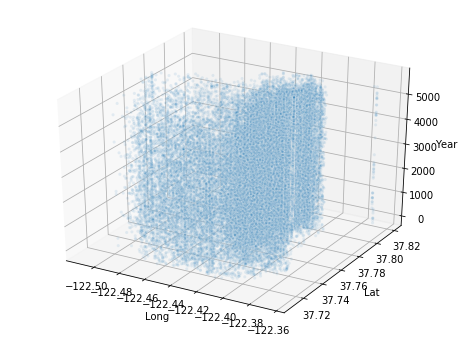

In [203]:
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(q['X'], q['Y'], q['days_since_2003-01-01'], s=10, alpha=0.1, edgecolors='w')

ax.set_xlabel('Long')
ax.set_ylabel('Lat')
ax.set_zlabel('Year')
plt.savefig('python_images/3d_space_time_cube_crimes_robberies2.png',transparent=True)
plt.show()

In [204]:
q['size'] = 0.5
fig = px.scatter_3d(q, x='X', y='Y', z='days_since_2003-01-01',
              color='PdDistrict', opacity=0.1,size='size')
fig.write_image("python_images/{}.png".format('3d_space_time_cube_crimes_robberies'))
fig.show()

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [142]:
trace = go.Scatter3d(
    x=q.X,
    y=q.Y,
    z=q.Year,
    mode='markers',
    marker=dict(
        size=12,
        line=dict(
            color='rgba(217, 217, 217, 0.14)',
            width=0.5
        ),
        opacity=0.8
    )
)
layout = go.Layout(
    margin=dict(
        l=0,
        r=0,
        b=0,
        t=0
    )
)
fig = go.Figure(data=[trace], layout=layout)
py.iplot(fig, filename='simple-3d-scatter')

PlotlyRequestError: This file is too big! Your current subscription is limited to 524.288 KB uploads. For more information, please visit: https://go.plot.ly/get-pricing.

# Density Based Clustering

In [205]:
from sklearn.cluster import DBSCAN as dbscan
import math
# dbscan is density based clustering
# 12-step qualitative color scale, courtesy of www.colorbrewer2.org
clust_colors = ['#a6cee3','#1f78b4','#b2df8a','#33a02c','#fb9a99','#e31a1c','#fdbf6f','#ff7f00','#cab2d6','#6a3d9a','#ffff99','#b15928']

Defaults for DBScan

In [206]:
kms_per_radian = 6371.0088

In [207]:
from math import radians, cos, sin, asin, sqrt
def haversine(lon1, lat1, lon2, lat2):
    """
    Calculate the great circle distance between two points 
    on the earth (specified in decimal degrees)
    """
    # convert decimal degrees to radians 
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])
    # haversine formula 
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * asin(sqrt(a)) 
    # Radius of earth in kilometers is 6371
    km = 6371* c
    return km
#The haversine formula determines the great-circle distance between two points on a sphere given their longitudes and latitudes.
def great_circle(lat1, long1, lat2, long2):

    # Convert latitude and longitude to 
    # spherical coordinates in radians.
    degrees_to_radians = math.pi/180.0
        
    # phi = 90 - latitude
    phi1 = (90.0 - lat1)*degrees_to_radians
    phi2 = (90.0 - lat2)*degrees_to_radians
        
    # theta = longitude
    theta1 = long1*degrees_to_radians
    theta2 = long2*degrees_to_radians
    
    # Compute spherical distance from spherical coordinates.
        
    # For two locations in spherical coordinates 
    # (1, theta, phi) and (1, theta, phi)
    # cosine( arc length ) = 
    #    sin phi sin phi' cos(theta-theta') + cos phi cos phi'
    # distance = rho * arc length
    
    cos = (math.sin(phi1)*math.sin(phi2)*math.cos(theta1 - theta2) + 
           math.cos(phi1)*math.cos(phi2))
    
    if (cos > 1.0):
        cos = 1.0

    arc = math.acos( cos )

    # Remember to multiply arc by the radius of the earth 
    # in your favorite set of units to get length.
    return arc

def SpaceDistance(x,y):
    try:
        gc_dist = great_circle(x[1],x[0],y[1],y[0])
    except ValueError:
        gc_dist = np.Infinity
    
    if (gc_dist>spatial_dist_max):
        return np.Infinity
    else:
        return gc_dist
    #return great_circle(x[1],x[0],y[1],y[0])

def SpaceTimeDistance(x,y):
    #print('Params = {},{}'.format(spatial_dist_max,temporal_dist_max))
    diff_days = math.fabs(x[2] - y[2])
    #print('X = {}, Y = {}'.format(x,y))
    if (np.isnan(diff_days) or diff_days > temporal_dist_max):
        return np.Infinity
    
    try:
        gc_dist = great_circle(x[1],x[0],y[1],y[0])
    except ValueError:
        gc_dist = np.Infinity
    
    if (gc_dist>spatial_dist_max):
        print(gc_dist)
        return np.Infinity
    
    ratio_t=diff_days/temporal_dist_max
    ratio_d=gc_dist/spatial_dist_max
    if (ratio_d>ratio_t):
        return gc_dist
    else:
        return ratio_t * spatial_dist_max

### Running space-time clustering
You may want to modify parameters and then run the following cells for assessing clusters.

We have test the following sets of parameters:

spatial_dist_max = 30 / kms_per_radian; temporal_dist_max = 3; min_samples=3

spatial_dist_max = 30 / kms_per_radian; temporal_dist_max = 7; min_samples=3

spatial_dist_max = 20 / kms_per_radian; temporal_dist_max = 7; min_samples=3

spatial_dist_max = 20 / kms_per_radian; temporal_dist_max = 7; min_samples=7

In [208]:
#df = PD_Recs_nhood_map[['nhood','Category','IncidntNum','PdDistrict','X','Y','Date_Time','Year']]
PD_Recs_nhood_map.info()
#del PD_Recs_nhood_map

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 2212270 entries, 0 to 27
Data columns (total 19 columns):
nhood                    object
geometry                 geometry
index_right              int64
IncidntNum               int64
Category                 object
Descript                 object
DayOfWeek                object
PdDistrict               object
Resolution               object
Address                  object
X                        float64
Y                        float64
Month                    object
Year                     int64
Date_Time                datetime64[ns]
Day                      int64
Hour                     int64
Day Of Week              int64
days_since_2003-01-01    float64
dtypes: datetime64[ns](1), float64(3), geometry(1), int64(6), object(8)
memory usage: 337.6+ MB


In [221]:
spatial_dist_max = 20 / kms_per_radian
temporal_dist_max = 20
epsilon = 5 / kms_per_radian
from sklearn.cluster import DBSCAN
nhood = PD_Recs_nhood_map.nhood.unique()[5]
category = PD_Recs_nhood_map.Category.unique()[5]


In [222]:
#nhood_df =  PD_Recs_nhood_map[(PD_Recs_nhood_map['Category'] == 'ROBBERY') & (PD_Recs_nhood_map['nhood'].isin(['Mission','South of Market','Tenderloin']))]
nhood_df =  PD_Recs_nhood_map[(PD_Recs_nhood_map['Category'] == 'ROBBERY')]
nhood_df.sort_values(['Date_Time','Hour'],inplace=True)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [223]:
#nhood_df['days_since_2003-01-01'] = calculate_days_since_2003(nhood_df)

In [224]:
nhood_df

,nhood,geometry,index_right,IncidntNum,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y,Month,Year,Date_Time,Day,Hour,Day Of Week,days_since_2003-01-01
20,Mission,"POLYGON ((-122.41096 37.76943, -122.41093 37.7...",188,30001012,ROBBERY,ROBBERY ON THE STREET WITH A GUN,Wednesday,MISSION,NONE,CAPP ST / 25TH ST,-122.417201,37.750705,January,2003,2003-01-01 03:57:00,1,3,2,0.164583
14,Tenderloin,"POLYGON ((-122.41917 37.77528, -122.41926 37.7...",225,30001357,ROBBERY,"ROBBERY ON THE STREET, STRONGARM",Wednesday,TENDERLOIN,NONE,TURK ST / TAYLOR ST,-122.410769,37.783215,January,2003,2003-01-01 07:37:00,1,7,2,0.317361
39,West of Twin Peaks,"POLYGON ((-122.46104 37.75096, -122.46055 37.7...",297,30001921,ROBBERY,ATTEMPTED ROBBERY ON THE STREET WITH A GUN,Wednesday,TARAVAL,NONE,2400 Block of OCEAN AV,-122.471004,37.730591,January,2003,2003-01-01 11:40:00,1,11,2,0.486111
14,Tenderloin,"POLYGON ((-122.41917 37.77528, -122.41926 37.7...",360,30002076,ROBBERY,"ROBBERY ON THE STREET, STRONGARM",Wednesday,SOUTHERN,NONE,1000 Block of MARKET ST,-122.411071,37.781751,January,2003,2003-01-01 13:05:00,1,13,2,0.545139
14,Tenderloin,"POLYGON ((-122.41917 37.77528, -122.41926 37.7...",393,30002424,ROBBERY,"ROBBERY, ARMED WITH A DANGEROUS WEAPON",Wednesday,TENDERLOIN,"ARREST, BOOKED",0 Block of JONES ST,-122.412193,37.781605,January,2003,2003-01-01 15:15:00,1,15,2,0.635417
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,Bayview Hunters Point,"POLYGON ((-122.38158 37.75307, -122.38157 37.7...",2213074,180359797,ROBBERY,"ROBBERY, BODILY FORCE",Sunday,BAYVIEW,NONE,0 Block of VESTA ST,-122.399995,37.730891,May,2018,2018-05-13 23:30:00,13,23,6,5611.979167
27,South of Market,"POLYGON ((-122.40371 37.78404, -122.40271 37.7...",2213127,180359606,ROBBERY,"ROBBERY OF A COMMERCIAL ESTABLISHMENT, STRONGARM",Monday,SOUTHERN,"ARREST, BOOKED",900 Block of MARKET ST,-122.408421,37.783570,May,2018,2018-05-14 16:10:00,14,16,0,5612.673611
27,South of Market,"POLYGON ((-122.40371 37.78404, -122.40271 37.7...",2213147,180360352,ROBBERY,"ROBBERY, BODILY FORCE",Monday,SOUTHERN,NONE,NATOMA ST / 9TH ST,-122.413721,37.775437,May,2018,2018-05-14 20:01:00,14,20,0,5612.834028
14,Tenderloin,"POLYGON ((-122.41917 37.77528, -122.41926 37.7...",2213152,180360603,ROBBERY,"ROBBERY, BODILY FORCE",Monday,TENDERLOIN,"ARREST, BOOKED",700 Block of OFARRELL ST,-122.417085,37.785215,May,2018,2018-05-14 21:45:00,14,21,0,5612.906250


In [225]:
clustered = DBSCAN(eps=epsilon,metric=SpaceTimeDistance, min_samples=3).fit(nhood_df[['X','Y','days_since_2003-01-01']])
labels=clustered.labels_
unique_labels=np.unique(clustered.labels_)
print('Clusters: -1 for noise consisting of {} records and {} clusters labelled as 0..{}'.format(nhood_df[labels==-1].shape[0], len(unique_labels)-1, len(unique_labels)-2))
#clustered
clust_id_col_name='ClusterN'
nhood_df[clust_id_col_name]=labels

Clusters: -1 for noise consisting of 2 records and 2 clusters labelled as 0..1


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [226]:
nhood_df.ClusterN.unique()

array([ 0, -1,  1], dtype=int64)

In [227]:
agg_func = {
    'IncidntNum':'count',
    'days_since_2003-01-01':['max','min'],
    'X':['mean','max','min'],
    'Y':['mean','max','min']
}
st_aggregates = nhood_df.reset_index(drop=False)[['ClusterN','IncidntNum','days_since_2003-01-01','X','Y']].groupby(['ClusterN']).agg(agg_func)
# Flatten hierarchical column names
st_aggregates.columns = ["_".join(x) for x in st_aggregates.columns.ravel()]
# compute derived attributes: duration and bounding rectangle diagonal
st_aggregates['duration (days)']=st_aggregates['days_since_2003-01-01_max']-st_aggregates['days_since_2003-01-01_min']
for id,row in st_aggregates.iterrows():
    brd=kms_per_radian*great_circle(row['Y_max'],row['X_max'],row['Y_min'],row['X_min'])
    #print('{}'.format(brd))
    st_aggregates.at[id,'Bound_rect_diag(km)']=brd
st_aggregates

,IncidntNum_count,days_since_2003-01-01_max,days_since_2003-01-01_min,X_mean,X_max,X_min,Y_mean,Y_max,Y_min,duration (days),Bound_rect_diag(km)
ClusterN,,,,,,,,,,,
-1,2,3176.861806,2828.826389,-122.499630,-122.492127,-122.507133,37.762093,37.762900,37.761286,348.035417,1.331231
0,47081,4647.000694,0.164583,-122.420770,-122.364937,-122.511422,37.764169,37.810204,37.708327,4646.836111,17.150957
1,8720,5613.059028,4647.559028,-122.419891,-122.365565,-122.511294,37.767547,37.819923,37.708475,965.500000,17.823351


Space-time clusters in 3D:

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:376: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:494: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



<Figure size 720x576 with 0 Axes>

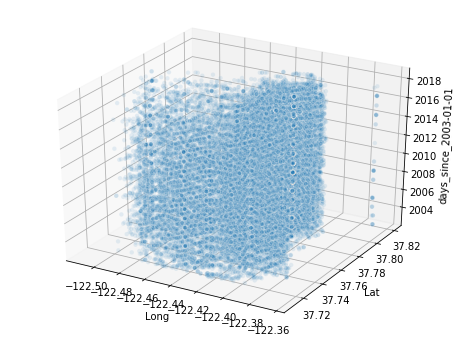

In [228]:
fig = plt.figure(1, figsize=(10, 8))
for id,row in nhood_df.iterrows():
    cluster_id = row[clust_id_col_name]
    if (cluster_id==-1):
        color='#000000'
    else:
        color=clust_colors[cluster_id % len(clust_colors)]
    nhood_df.at[id,'colors']=color
qnn = nhood_df[nhood_df[clust_id_col_name] != -1] # no noise 

fig = plt.figure(figsize=(8, 6))

ax = fig.add_subplot(111, projection='3d')
ax.scatter(qnn['X'], qnn['Y'], qnn['Year'], s=20, alpha=0.1, edgecolors='w',c=qnn['colors'])
ax.set_xlabel('Long')
ax.set_ylabel('Lat')
ax.set_zlabel('days_since_2003-01-01')
plt.show()


Only noise in 3D:

noise data, shape=(2, 21)


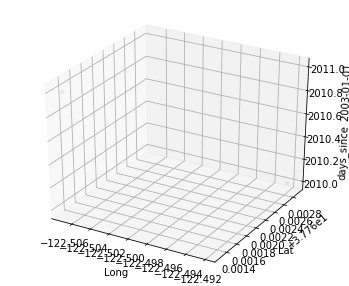

In [229]:
nhood_noise = nhood_df[nhood_df[clust_id_col_name] == -1]
print('noise data, shape={}'.format(nhood_noise.shape))
fig = plt.figure(1, figsize=(6, 5))
#ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=15, azim=134) # change parameters here for experimenting
#ax.scatter(nhood_df['X'], nhood_df['Y'], nhood_df['days_since_2003-01-01'], alpha=0.1)
#plt.show()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(nhood_noise['X'], nhood_noise['Y'], nhood_noise['Year'], s=20, alpha=0.1, edgecolors='w')
ax.set_xlabel('Long')
ax.set_ylabel('Lat')
ax.set_zlabel('days_since_2003-01-01')
plt.show()

# Now we extract non-noise data to a new table and then run DBScan with spatial similarity measure

Now we ignore times!

no noise data, shape=(55801, 21)


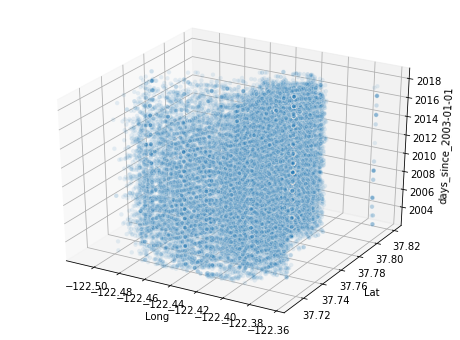

In [230]:
qnn = nhood_df[nhood_df[clust_id_col_name] != -1] # no noise 
fig = plt.figure(figsize=(8, 6))

print('no noise data, shape={}'.format(qnn.shape))

ax = fig.add_subplot(111, projection='3d')
ax.scatter(qnn['X'], qnn['Y'], qnn['Year'], s=20, alpha=0.1, edgecolors='w')
ax.set_xlabel('Long')
ax.set_ylabel('Lat')
ax.set_zlabel('days_since_2003-01-01')
plt.show()


In [ ]:
spatial_dist_max = 20 / kms_per_radian
clustered = DBSCAN(eps=epsilon,metric=SpaceDistance, min_samples=7).fit(qnn[['X','Y']])
labels=clustered.labels_
unique_labels=np.unique(clustered.labels_)
print('Clusters: -1 for noise consisting of {} records and {} clusters labelled as 0..{}'.format(qnn[labels==-1].shape[0], len(unique_labels)-1, len(unique_labels)-2))
clust_id_col_name='ClusterNN'
qnn[clust_id_col_name]=labels
#clustered
m = fm.Map(tiles='cartodbpositron', width='100%', height='100%') # If you adjusted the notebook display width to be as wide as your screen, the map might get very big. Adjust size as desired.
m.fit_bounds([[lat_range[0], long_range[0]], [lat_range[1], long_range[1]]])
for id, row in qnn.iterrows():
    cluster_id = row[clust_id_col_name]
    if (row[clust_id_col_name] != -1):
        fm.CircleMarker((row['Y'], row['X']), radius=2, color=clust_colors[row[clust_id_col_name]%len(clust_colors)], fill=False, popup='Cluster: {}'.format(row[clust_id_col_name])).add_to(m) 
m

Space-time clusters on the map:

In [ ]:
m = fm.Map(tiles='cartodbpositron', width='100%', height='100%') # If you adjusted the notebook display width to be as wide as your screen, the map might get very big. Adjust size as desired.
m.fit_bounds([[lat_range[0], lon_range[0]], [lat_range[1], lon_range[1]]])
for id, row in events.iterrows():
    cluster_id = row[clust_id_col_name]
    if (row[clust_id_col_name] != -1):
        fm.CircleMarker((row['Y'], row['X']), radius=2, color=clust_colors[row[clust_id_col_name]%len(clust_colors)], fill=False, popup='Cluster: {}'.format(row[clust_id_col_name])).add_to(m) 
m

# Neighborhood wise mapping of street robberies

In [40]:
nhood_incidents_street_robs = street_robs.nhood.value_counts()
nhood_map = nhood_map.merge(nhood_incidents_street_robs.to_frame('Incidents_Street_Robs'), left_on = 'nhood',right_index = True)

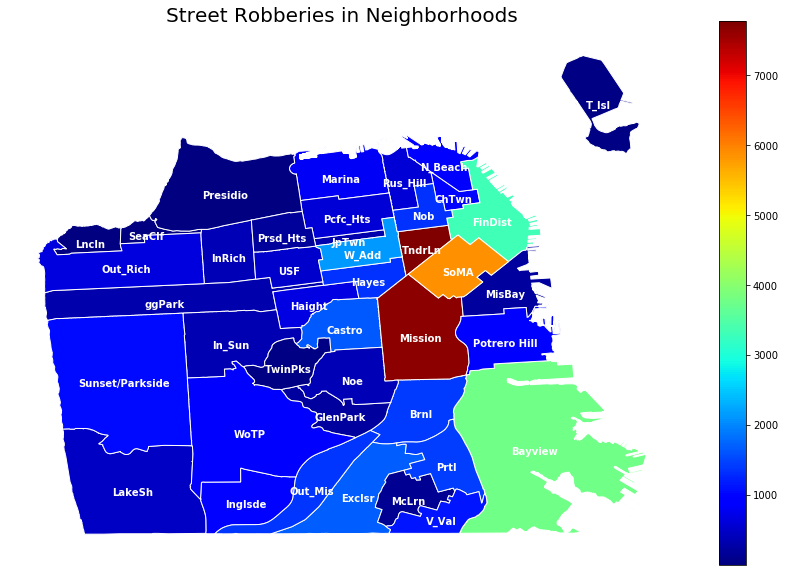

In [41]:
axx = nhood_map.plot(column = 'Incidents_Street_Robs', cmap='jet',figsize=(15,10),legend =True,linewidth=1,edgecolor='white')
axx.axis('off')
#axx.legend(title='Incidents',fontsize=20)
axx.set_title('Street Robberies in Neighborhoods',fontsize=20,color='black')
for i in nhood_map.index:
    coords = nhood_map.geometry[i].centroid.coords[0]
    axx.annotate(s = nhood_map['abbr'][i], xy = coords,horizontalalignment='center',verticalalignment='top' ,color='white',fontweight='heavy')

plt.savefig('Robberies_Nhood.png',transparent=True)

# Methods of Street Robberies

In [42]:
# Methods of Street Robberies
methods = street_robs['Descript'].value_counts()
method_labels = methods.index
method_values = methods

pie_methods = go.Pie(labels = method_labels, values = method_values,hoverinfo = 'label+percent',
                     textinfo = 'value',hole=0.67,rotation=160)

data = [pie_methods]

layout = go.Layout(
    #height = 1000,
    showlegend=False,
    title = dict(text='Methods of <br> Street Robberies',x=0.5,y=0.5,font=dict(size=23))
)

fig = go.Figure(data,layout=layout)

py.iplot(fig)

# Spatial distribution of incidents

 To get a spatial sense of these incidents, we'll plot them on a map using the MapBox Plugin. 

In [43]:
# Generate an access token for this project 
mapbox_access_token  = 'pk.eyJ1IjoibmF2bW9oYW4iLCJhIjoiY2p0bmZvYWN1MHgzbzQzcGVxY3FxbnFnbCJ9.bguGCD3m6L1HXWc9DR7ycQ'

data = []

years = np.sort(pd.unique(street_robs['Year']))
for i in range(len(years)):
    datapoints = street_robs[street_robs['Year']==years[i]]
    trace = go.Scattermapbox(
        lat = datapoints['Y'],
        lon = datapoints['X'],
        #mode = 'lines+markers',
        #text = [str(k) for k in range(len(dataseg))],
        name = str(datapoints['Year'].iloc[0]),
        marker = go.scattermapbox.Marker(size = 10,opacity = 0.7),
        text = datapoints[['Date_Time','Descript']]
    )
    data.append(trace)


layout = go.Layout(
    title = ' Annual Incidence of Street Robberies',
    width = 1000,
    height = 1000,
    #traceorder = 'normal',
    mapbox=go.layout.Mapbox(
        accesstoken=mapbox_access_token,
        #bearing=-50,
        #pitch = 50,
        zoom=12,
        center=go.layout.mapbox.Center(
            lat=37.75,
            lon=-122.44,
        ),
        style='mapbox://styles/mihalw28/cjlz6bzrv697i2rpec2yqartr'
    ),
)


fig = go.Figure(data = data, layout = layout)
py.iplot(fig)

PlotlyRequestError: This file is too big! Your current subscription is limited to 524.288 KB uploads. For more information, please visit: https://go.plot.ly/get-pricing.

# Hourly/Daily/Monthly distributions across NHoods

In [44]:
nhoods = pd.unique(street_robs['nhood'])
data = []
months = {1:'JAN', 2:'FEB', 3:'MARCH', 4:'APR', 5:'MAY', 6:'JUNE', 7:'JULY', 8:'AUG', 9:'SEPT', 10:'OCT', 11:'NOV', 12:'DEC'}
for i in range(len(nhoods)):
    nhood_Months = street_robs[street_robs['nhood']==nhoods[i]]['Month'].value_counts().reset_index().rename(columns={'index':'month','Month':'incidents'}).sort_values(by='month')
    trace = go.Bar(
        x = nhood_Months.month.map(months),
        y = nhood_Months.incidents,
        opacity = 0.6,
        name = nhoods[i],
        #marker = dict(color=color_nhoods[i])
        
    )
    data.append(trace)

layout = go.Layout(
    title = 'MONTHLY INCIDENCE OF STREET ROBBERIES',
    barmode = 'stack'

)

fig = go.Figure(data,layout)

py.iplot(fig)

In [68]:
Nhoods = pd.unique(street_robs['nhood'])
days = {0:'MON',1:'TUE',2:'WED',3:'THUR',4:'FRI',5:'SAT',6:'SUN'}
data = []
for i in range(len(Nhoods)):
    trace = go.Histogram(
        x = street_robs[street_robs['nhood']==Nhoods[i]].sort_values('Day Of Week')['Day Of Week'].map(days),
        opacity = 0.6,
        name = Nhoods[i],
        #marker = dict(color=color_Nhoods[i])
        
    )
    data.append(trace)

layout = go.Layout(
    title = 'DAILY INCIDENCE OF STREET ROBBERIES',
    barmode = 'stack'

)

fig = go.Figure(data,layout)
py.iplot(fig)

C:\Users\NavaM\Anaconda3\lib\site-packages\IPython\core\display.py:689: UserWarning:

Consider using IPython.display.IFrame instead



In [69]:
Nhoods = pd.unique(street_robs['nhood'])
data = []
for i in range(len(Nhoods)):
    Nhood_Hours = street_robs[street_robs['nhood']==Nhoods[i]]['Hour'].value_counts()
    trace = go.Bar(
        x = Nhood_Hours.index,
        y = Nhood_Hours,
        opacity = 0.8,
        name = Nhoods[i],
        #marker = dict(color=color_Nhoods[i])
        
    )
    data.append(trace)

layout = go.Layout(
    title = 'HOURLY INCIDENCE OF STREET ROBBERIES',
    barmode = 'stack',
    xaxis = dict(dtick=1)
    )

fig = go.Figure(data,layout)

#use iplot for in notebook plot. 
#use plot for loading onto your plotly user account

py.iplot(fig)
#py.plot(fig)

# Temporal heat map of Street Robberies

In [70]:
years = np.sort(pd.unique(street_robs['Year']))
data = []
days = {0:'MON',1:'TUE',2:'WED',3:'THUR',4:'FRI',5:'SAT',6:'SUN'}

for i in years:
    datapoints= street_robs[street_robs['Year']==i].sort_values(by='Day Of Week')
    trace = go.Histogram2dContour(
        x = datapoints['Hour'],
        y = datapoints['Day Of Week'].map(days),
        name = str(i),
        contours = dict(coloring='fill',showlines=False,),
        ncontours = 8,
        zmin=0,zmax=130,
    )
    data.append(trace)

steps = []
for i in range(len(data)):
    year = dict(
        method = 'restyle',  
        args = ['visible', [False] * len(data)],
        label = str(years[i])
    )
    year['args'][1][i] = True # Toggle i'th trace to "visible"
    steps.append(year)

sliders = [dict(
    active = 2013,
    currentvalue = {"prefix": "Year: "},
    pad = {"t": 50},
    steps = steps,
    yanchor = 'top'
)]

layout = go.Layout(
    sliders = sliders,
    title = 'Street robberies over the years',
    xaxis = dict(range=[0,24]),
    yaxis = dict(range=[0,6]),
    width = 800,
    height = 600,
    hovermode = 'x',
)


fig = go.Figure(data,layout=layout)
py.iplot(fig)

The draw time for this plot will be slow for clients without much RAM.


C:\Users\NavaM\Anaconda3\lib\site-packages\plotly\api\v1\clientresp.py:40: UserWarning:

Estimated Draw Time Slow

C:\Users\NavaM\Anaconda3\lib\site-packages\IPython\core\display.py:689: UserWarning:

Consider using IPython.display.IFrame instead

